# 🥬 Leaf Disease Classfication

**Data Info**
we are going to take the following approach:
1. Problem definition
2. Data
3. Evaluation
4. Features
5. Modelling
6. Experimentation


## 1. Problem Definition

Given a leaf data , can we predict what disease it has ?

## 2. Data

the data is downloaded from the Kaggle Plant Village challeng : https://www.kaggle.com/datasets/arjuntejaswi/plant-village

## 3. Evaluation

evaluated based on their categorization accuracy.


## Features

some information about the data :

  * We're dealing with the images(unstructred data) so it's probably best we use deeplearnig/treasfer learning

In [4]:
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
# !kaggle competitions download -c plant-villag

In [5]:
!kaggle datasets download arjuntejaswi/plant-village

^C
User cancelled operation


In [ ]:
!unzip /content/drive/MyDrive/Deeplearning/leaf_disease/plant-village.zip

Archive:  /content/drive/MyDrive/Deeplearning/leaf_disease/plant-village.zip
replace PlantVillage/Pepper__bell___Bacterial_spot/0022d6b7-d47c-4ee2-ae9a-392a53f48647___JR_B.Spot 8964.JPG? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Get our Workspace Ready

* import Tensorflow 2. 0 ✅

* import Tensorflow Hub ✅

* Make sure we're using ✅

In [150]:
import tensorflow as tf
import pandas as pd
import numpy as np
import tensorflow_hub as hub
import seaborn as sns
import tensorflow_hub as hub
from tensorflow.keras import models, layers
import os

## Getting out data ready (turning into tensors)

with all machine learning models,out data has to be in numberical format. so that's what we'll be doing first.Turning our images into
Tensors (numerical representations)

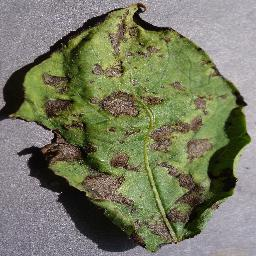

In [ ]:
# visualize the image
from IPython.display import Image
Image("/content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/Potato___Early_blight/001187a0-57ab-4329-baff-e7246a9edeb0___RS_Early.B 8178.JPG")

In [ ]:
# make df for the image file and label
import os

potato_late=os.listdir("/content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/Potato___Late_blight")
potato_early=os.listdir("/content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/Potato___Early_blight")
potato_healthy=os.listdir("/content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/Potato___healthy")


In [ ]:
len(potato_late),len(potato_early),len(potato_healthy)

(1000, 1000, 152)

In [ ]:
# lets create the dataFrame
df = pd.DataFrame(columns=['id', 'leaf_family','file_path'])

# fit the dataFrame with the data
data={
    "potato_late": potato_late,
    "potato_early": potato_early,
    "potato_healthy": potato_healthy,
}
file_name={
   "potato_late":"Potato___Late_blight" ,
    "potato_early":"Potato___Early_blight",
    "potato_healthy":"Potato___healthy",
}
file_path='/content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/'

for key in data:
    for i in range(len(data[key])):
        df = df.append({'id': data[key][i][:-4], 'leaf_family': key, 'file_path': file_path+ file_name[key]+'/'+data[key][i]}, ignore_index=True)




<ipython-input-5-a2639510e9cf>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'id': data[key][i][:-4], 'leaf_family': key, 'file_path': file_path+ file_name[key]+'/'+data[key][i]}, ignore_index=True)
<ipython-input-5-a2639510e9cf>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'id': data[key][i][:-4], 'leaf_family': key, 'file_path': file_path+ file_name[key]+'/'+data[key][i]}, ignore_index=True)
<ipython-input-5-a2639510e9cf>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'id': data[key][i][:-4], 'leaf_family': key, 'file_path': file_path+ file_name[key]+'/'+data[key][i]}, ignore_index=True)
<ipython-input-5-a2639510e9cf>:19: FutureWarning: The frame.append method is

In [ ]:
#load data from
df=pd.read_csv('leafe_disease.csv')
df=df.sample(frac=1)
df


,id,leaf_family,file_path
2049,51a03694-82cd-43a5-9877-ddce42c1a5ad___RS_HL 1779,potato_healthy,./data/PlantVillage/Potato___healthy/51a03694-...
14,030e8945-d3ce-4ad3-8a91-a14c18285249___RS_LB 2532,potato_late,./data/PlantVillage/Potato___Late_blight/030e8...
693,b57c6336-3be6-4021-b240-8547da86d218___RS_LB 5007,potato_late,./data/PlantVillage/Potato___Late_blight/b57c6...
560,93d91b96-e024-477c-9b76-796e3f1614d4___RS_LB 3297,potato_late,./data/PlantVillage/Potato___Late_blight/93d91...
779,cd04dd6c-fe7b-4587-ae2e-69228969d9d6___RS_LB 4824,potato_late,./data/PlantVillage/Potato___Late_blight/cd04d...
...,...,...,...
790,cf83a586-2f2a-423b-8e1c-f7c284a20ec1___RS_LB 2785,potato_late,./data/PlantVillage/Potato___Late_blight/cf83a...
1604,9d0c69df-f5dc-4118-a654-ab40d100b9b6___RS_Earl...,potato_early,./data/PlantVillage/Potato___Early_blight/9d0c...
1403,69a20537-e5fd-4f1e-8800-ef9aa4fa4766___RS_Earl...,potato_early,./data/PlantVillage/Potato___Early_blight/69a2...
961,f795a3d7-2915-447c-9e6f-df1d895f98bc___RS_LB 2792,potato_late,./data/PlantVillage/Potato___Late_blight/f795a...


#  Turning labels to numbers

In [6]:
labels=df['leaf_family'].to_numpy()

# find the unique labels
unique_labels=np.unique(labels)
print(unique_labels)

['potato_early' 'potato_healthy' 'potato_late']


In [7]:
# Turn a single label into an array of booleans

labels[0]==unique_labels



array([False,  True, False])

In [8]:
# now Turn all label

boolean_labels=[label==unique_labels for label in labels]

In [9]:
file_paths=df["file_path"]

### create x (feature) and y (label) for training and validation

In [10]:
X=file_paths
y=boolean_labels

# we going to start off experimenting with

1.   List item
2.   List item

`300` images and increase as needed


In [140]:
# set number of images to use for experimenting
# 80/20 split

NUM_IMAGES=500 #@param {types:"sliders",min:1000,max:10000}

1722

## Preprocess the image (turing to tensors)

to preprocess our image we going to create the function and follow few steps

1. use Tensorflow to read the image
2. turn or image `png/jpeg` to tensor
3. resize the image to `(224,224)`
4. return the coverted image

In [12]:
# # conver image to numpy
# from matplotlib.pyplot import imread

# image=imread(file_names[34])
# # turn image to Tensors
# tf.constant(image)

In [13]:
# image_file=tf.io.read_file(file_names[3])

In [14]:
# define the image size
IMG_SIZE=224

# lets createthe function to process the image

def process_image(image_path,img_size=IMG_SIZE):
   """
  Takes an image file path and turns the image into a tensor
  """

   # read the iamge file
   image_file=tf.io.read_file(image_path)

   # Turn jpeg image into numerical tensor with 3 colours channels (Red,blue,Green)

   image=tf.image.decode_jpeg(image_file,channels=3)

   # Normalize the value from 0-255 to 0-1
   image=tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image
   image=tf.image.resize(image,size=[img_size,img_size])

   return image

## Turning our data into batches

why turn our data into batches 🤔 ?

let's say you're trying to process 10000+ images in one go they all might not fit into the memory.

so that's why we do about 32 (this is the batch size) images at a time (you can adjust he batch size )

in order to use TensorFlow effectively, we need our data into form of tensor tuples whihc look like `(image,label)`



In [15]:
# create a function to return a tuple(image,label)

def get_image_label(image_path,label):

    """
    Take an image file path name and the associated label
    process the image with the `process image function`
    """
    image=process_image(image_path)
    return image,label

Now we've got a way to turn the iage into tuples of Tensors

let's make a function to turn all of our data into batches !

In [16]:
# lets Batch size
BATCH_SIZE = 32

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
    """
    This Function Turn the data into image (x) and label (y) paris

    shuffles the data if it's training data but not for validation data

    also accepts test data as input (no labels)
    """

    # for Test Data
    if test_data:
        print("Making the test data batch 🧑‍🍳")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file path (no labels)

        data_batches=data.map(process_image).batch(BATCH_SIZE)

        return data_batches

    # for Validation Data
    elif valid_data:
        print("Making the Validation data batch 🧑‍🍳")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                                    tf.constant(y)))
        data_batches=data.map(get_image_label).batch(BATCH_SIZE)

        return data_batches
    else:
        print ("Making the Training data batch 🧑‍🍳")

        # Turn file path and labels into data batches
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                                    tf.constant(y)))
        # Shuffling path and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(x))

        # Create (image,label) tuples (this also turns the image path into a preprocessed image)
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batches = data.batch(BATCH_SIZE)

        return data_batches


In [187]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(
    X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)


In [188]:
len(x_train),len(x_test),len(y_train),len(y_test)

(400, 100, 400, 100)

In [189]:
# create train and valid data batches

train_data=create_data_batches(x=x_train,y=y_train)

val_data=create_data_batches(x_test,y_test,valid_data=True)


Making the Training data batch 🧑‍🍳
Making the Validation data batch 🧑‍🍳


## Visualizing data batches

our data i now in batches,
these can be a little hard to understand so letls write a fucntion to visualize it

In [172]:
import matplotlib.pyplot as plt

def show_25_image(images,labels):
    """
    This function is used to show 25 images with labels
    """
    # define the plt size
    plt.figure(figsize=(15,15))
    # loop 25 times
    for i in range(25):
        # define the subplot
        ax=plt.subplot(5,5,i+1) # 5*5=25
        # turn off the grid
        ax.grid(False)
        # turn off the axis
        plt.axis('off')

        # get the image
        img=images[i]
        # get the label
        label=unique_labels[labels[i].argmax()]
        """
            lables=[0,0,0,0,0,1,0]
            here argmax() -> give idx of i which is the breed name idx
        """
        # show the image
        plt.imshow(img)
        # set the title
        plt.title(label)




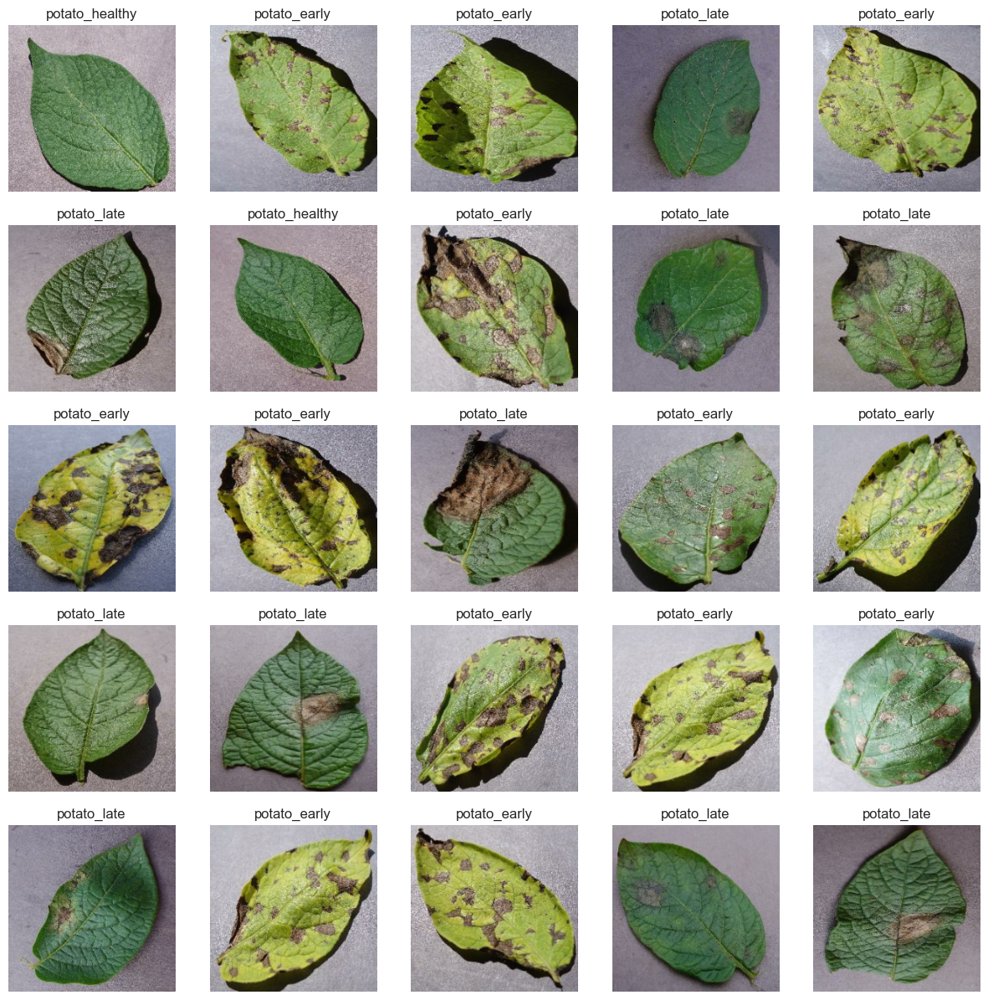

In [173]:
# unbatch our train data using next()

train_images,train_labels=next(train_data.as_numpy_iterator())


show_25_image(train_images, train_labels)



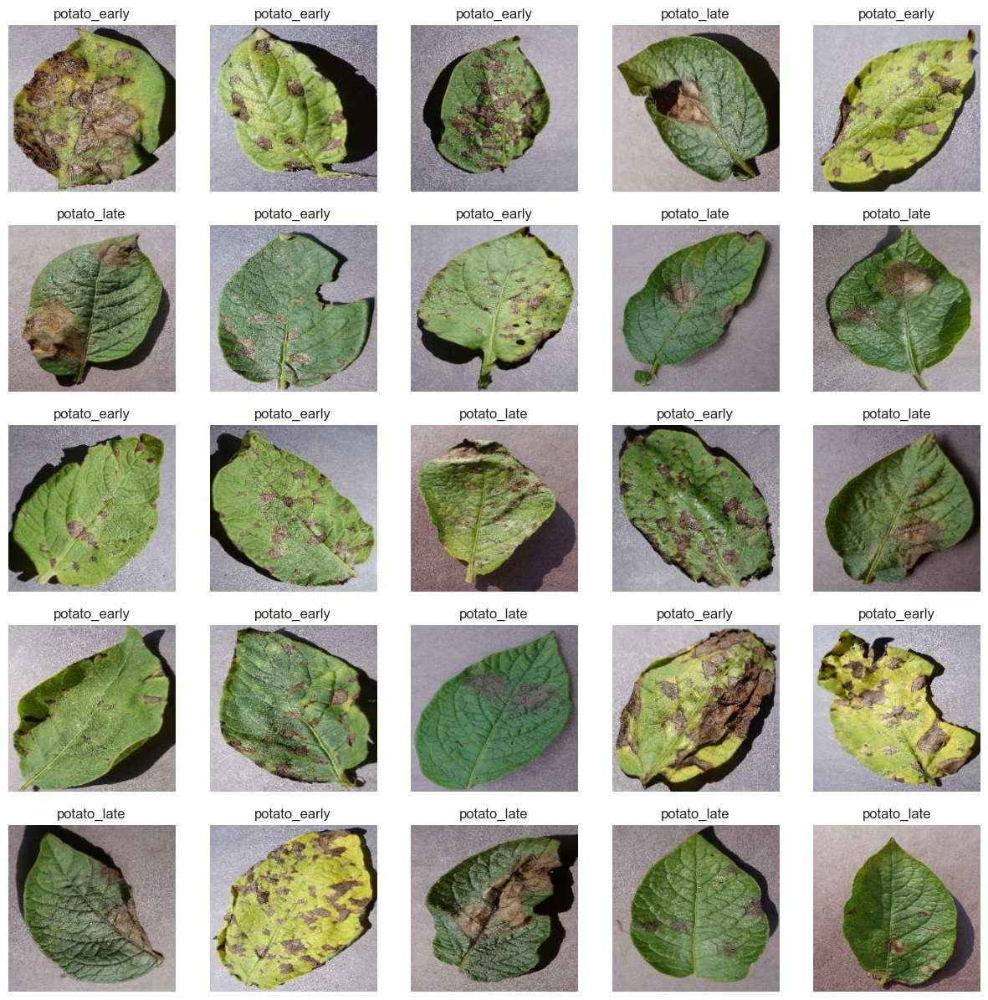

In [196]:
# lets do same for validation set

val_image,val_labels=next(val_data.as_numpy_iterator())

show_25_image(val_image,val_labels)

### Build the deep learning model

**2. CNN Architecture**

![image](https://miro.medium.com/v2/resize:fit:640/format:webp/1*5iA55983nBMlQn9f6ICxKg.png)


In [23]:
INPUT_SHAPE = [BATCH_SIZE, IMG_SIZE, IMG_SIZE, 3]  # batch , height,width,color

# setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

# model url from Tenserflow hub
MODEL_URL ="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [24]:
# create a function to build the model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building the model 🏗️ ",input_shape,output_shape,model_url)
  with tf.device('/device:GPU:0'):
  # 1 .create the model
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url), # Layer 1 (input layer)
        tf.keras.layers.Dense(
            units=OUTPUT_SHAPE,
            activation="softmax"  # layer 2 (output layer)
        )
    ])

    # 2.compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.legacy.Adam(),
        metrics=["accuracy"]
    )

    # 3.build the model
    model.build(input_shape)

  return model


In [25]:
model1=create_model()

Building the model 🏗️  [32, 224, 224, 3] 3 https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


KeyboardInterrupt: 

## Creating some callbacks

callbacks are helper functions a model can use during training to do such things as save its progress,
check its progress or stop training early if a model stops improving.


We'll create two callbacks:

    1. TensorBoard which helps tack our model's progress
    2. for early stopping which prevents our model from training for too long

### TensorBoard Callback


To setup a TensorBoard callback , we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training)

In [176]:
# Load TensorBoard notebook extension

%load_ext tensorboard

In [175]:
import datetime

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # create a log directory for storing TensorBoard logs
    logdir=os.path.join('/Volumes/Project-2/programming/machine_deep_learning/DL/logs',
                        # make it so the log get tracket when ever we run the experiment
                        datetime.datetime.now().strftime("%y%m%d-%H%M%S")
                        )

    return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps us to stop our mdoel from overfitting by stopping traning if a certain evaluation meteric stops improving

In [177]:
NUM_EPOCHS=100 #@param {types:"sliders",min:10,max:100, step:10}

In [178]:
# create a function to stop

early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=25# no of epocs
                                                )

## Traning a model (on subset of data)

our first model is only going to train on 300 image,to make sure everythingis working before traning with fill data

In [190]:
# Build a function to train adn return a trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a model

  model = create_model()

  # create a new TensorBaord session everytime we train a model
  # tensorbaord=create_tensorboard_callback()

  # fit the model to the date passing it the callbacks we created

  history=model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[early_stopping]
            )

  # return the model

  return [history,model]

In [191]:
train= train_model()

Building the model 🏗️  [32, 224, 224, 3] 3 https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
13/13 [==============================] - 8s 387ms/step - loss: 1.0435 - accuracy: 0.6675 - val_loss: 0.4247 - val_accuracy: 0.8900
Epoch 2/100
13/13 [==============================] - 3s 227ms/step - loss: 0.3602 - accuracy: 0.8825 - val_loss: 0.2942 - val_accuracy: 0.9300
Epoch 3/100
13/13 [==============================] - 3s 205ms/step - loss: 0.1745 - accuracy: 0.9550 - val_loss: 0.2061 - val_accuracy: 0.9300
Epoch 4/100
13/13 [==============================] - 3s 238ms/step - loss: 0.1147 - accuracy: 0.9700 - val_loss: 0.1884 - val_accuracy: 0.9500
Epoch 5/100
13/13 [==============================] - 3s 232ms/step - loss: 0.0838 - accuracy: 0.9875 - val_loss: 0.1759 - val_accuracy: 0.9500
Epoch 6/100
13/13 [==============================] - 3s 214ms/step - loss: 0.0732 - accuracy: 0.9850 - val_loss: 0.1681 - val_accuracy: 0.9500
Epoch 7/100
13/13 [========

In [192]:
model=train[1]
history=train[0]

In [200]:
save_model(model,'potato-leaf-disease-model-mini-1')

Saving model to: /Volumes/Project-2/programming/machine_deep_learning/DL/models/20231022-14171697964421-potato-leaf-disease-model-mini-1.h5...


'/Volumes/Project-2/programming/machine_deep_learning/DL/models/20231022-14171697964421-potato-leaf-disease-model-mini-1.h5'

In [ ]:
# model=load_model('/Volumes/Project-2/programming/machine_deep_learning/DL/models/potato-leaf-disease-model-2')

In [ ]:
model.evaluate(val_data)

In [157]:
# plot the loss curves

def plot_loss_curves(history):
    """
    Returns separate loss curves for training and validation metrics.
    """
    loss=history.history["loss"]
    val_loss=history.history["val_loss"]

    accuracy=history.history["accuracy"]
    val_accuracy=history.history["val_accuracy"]

    epochs=range(len(history.history["loss"]))

    # plot loss
    plt.plot(epochs,loss,label="training_loss")
    plt.plot(epochs,val_loss,label="val_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # plot accuracy
    plt.figure()
    plt.plot(epochs,accuracy,label="training_accuracy")
    plt.plot(epochs,val_accuracy,label="val_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()
    

In [125]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, title=None):
    """
    Makes a labelled confusion matrix comparing predictions and ground truth labels
    """

    # Assuming you have calculated the confusion matrix using confusion_matrix function
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=figsize)

    # Create a ConfusionMatrixDisplay object and display the confusion matrix
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    cmd.plot(cmap='Blues', values_format='d', xticks_rotation='vertical')

    # Optionally, you can add a title
    cmd.ax_.set_title(title)


4/4 [==============================] - 1s 229ms/step


<Figure size 1000x1000 with 0 Axes>

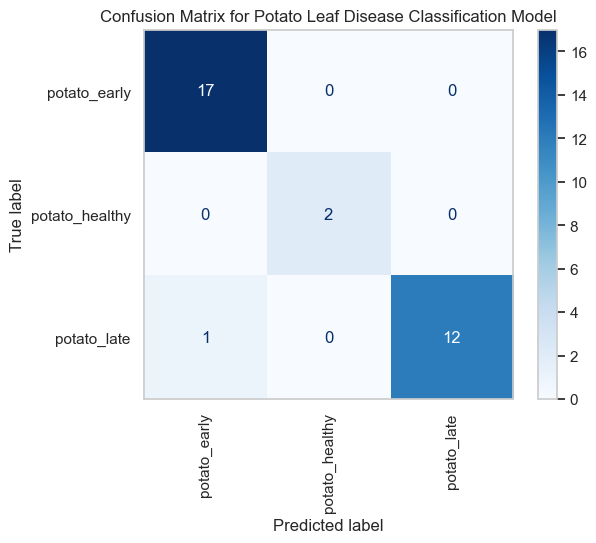

In [197]:

# make prediction on validation data

y_pred_probs=model.predict(val_data)


y_pred=y_pred_probs.argmax(axis=1)

val_label_bool=val_labels.argmax(axis=1)
# create confusion matrix

make_confusion_matrix(y_true=val_label_bool,
                        y_pred=y_pred[:len(val_label_bool)],
                        classes=unique_labels,
                        figsize=(10,10),
                        text_size=12,
                        title="Confusion Matrix for Potato Leaf Disease Classification Model")




## Method to get the Performance metrics such as Accuracy, Precision, Recall, F1 Score

In [159]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def evalute_model_performance(y_true,y_pred):
    """
    Returns model accuracy, precision, recall and F1 score of a binary classification model.
    """
    # calculate model accuracy
    model_accuracy = accuracy_score(y_true, y_pred) * 100
    # calculate model precision, recall and f1 score using "weighted average method"
    model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, y_pred, average="weighted")
    model_results = {"accuracy": model_accuracy,
                    "precision": model_precision * 100,
                    "recall": model_recall * 100,
                    "f1": model_f1 * 100}
    
    print(f"Accuracy: {model_accuracy:.2f}%")
    print(f"Precision: {model_precision * 100:.2f}%")
    print(f"Recall: {model_recall * 100:.2f}%")
    print(f"F1 Score: {model_f1 * 100:.2f}%")

    
    return model_results

Accuracy: 96.88%
Precision: 97.05%
Recall: 96.88%
F1 Score: 96.86%


<Figure size 1000x1000 with 0 Axes>

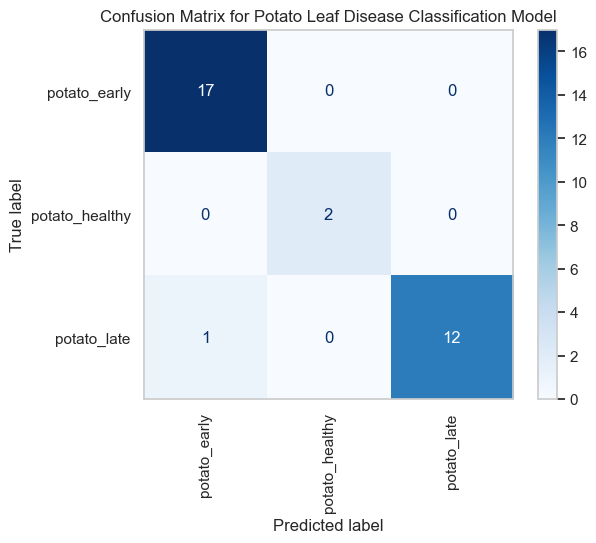

In [222]:

# get the performance metrics
model_results = evalute_model_performance(y_true=val_label_bool,
                                          y_pred=y_pred[:len(val_label_bool)])
make_confusion_matrix (y_true=val_label_bool,
                        y_pred=y_pred[:len(val_label_bool)],
                        classes=unique_labels,
                        figsize=(10,10),
                        text_size=12,
                        title="Confusion Matrix for Potato Leaf Disease Classification Model")


In [221]:
# lets create a function for plotting ROC curve
import matplotlib.pyplot as plt

def plot_roc_curve(fpr,tpr,model_name):
    fig,ax=plt.subplots()
    # plot roc curve
    ax.plot(fpr,tpr,color="orange",label="ROC")
    #plot line with no predictive power (baseline)
    ax.plot([0,1],[0,1],color="darkblue",linestyle="--",label="Guessing")

    # customize the plot
    ax.set(title=f"ROC Curve of {model_name}",xlabel="False Positive Rate",ylabel="True Positive Rate")
    #increase all the font size
    ax.tick_params(axis="both",which="major",labelsize=10)

    ax.legend(fontsize=16)
    ax.title.set_fontsize(16) # type: ignore


    ax.legend()




    plt.show()

In [210]:
%tensorboard --logdir /content/drive/MyDrive/Deeplearning/leaf_disease/PlantVillage/logs --port=8009

Launching TensorBoard...

KeyboardInterrupt: 

In [ ]:
!kill -9 PID



## Making and evaluatin predictions using a trained model

In [45]:
# make Predictions on the validation data (not used to rain on )

predictions=model.predict(val_data,verbose=1)
predictions

4/4 [==============================] - 1s 176ms/step


array([[9.9993837e-01, 2.1533558e-07, 6.1345265e-05],
       [9.8697960e-01, 8.4856618e-03, 4.5346939e-03],
       [7.4345531e-05, 4.1336592e-04, 9.9951231e-01],
       [7.8287674e-03, 1.4614705e-04, 9.9202514e-01],
       [2.4486455e-04, 1.0906500e-03, 9.9866450e-01],
       [3.9395774e-03, 4.3716070e-01, 5.5889970e-01],
       [1.2296737e-02, 5.8769056e-05, 9.8764449e-01],
       [7.9685752e-04, 1.4263549e-03, 9.9777681e-01],
       [9.9664837e-01, 1.1729808e-06, 3.3504141e-03],
       [2.1525780e-06, 9.3048184e-06, 9.9998856e-01],
       [9.9625236e-01, 1.6781256e-03, 2.0695284e-03],
       [1.0880046e-05, 3.0790146e-05, 9.9995840e-01],
       [9.9985170e-01, 1.4643526e-07, 1.4820018e-04],
       [9.9998546e-01, 1.8960293e-07, 1.4283511e-05],
       [7.3562148e-03, 5.9129708e-02, 9.3351406e-01],
       [9.9763691e-01, 1.3441079e-04, 2.2286731e-03],
       [7.9440349e-04, 5.2402816e-03, 9.9396533e-01],
       [3.3692257e-03, 6.0337490e-01, 3.9325589e-01],
       [9.9642003e-01, 8.524

In [220]:
unique_labels[predictions[1].argmax()]

NameError: name 'predictions' is not defined

In [47]:
# First predictions
print(predictions[90])
max_val=predictions[90].argmax()
print(f"probability of predictions:{max(predictions[0])*100:.2f}%")
print(f"Max index :{max_val}")
print(f"Predicted label:{unique_labels[max_val]}")


[9.9991369e-01 1.0578291e-07 8.6191358e-05]
probability of predictions:99.99%
Max index :0
Predicted label:potato_early


Having the above function is great but we want to scale it `(write a seprate function)` and it would be better if we could see the image with prediction :)

**Note**: Prediction probability into their respective label


## Conver numerical predictions to text

In [48]:
# Turn our numerical prediction - Text lbel

def get_prediction_label(pred_proba):
  """
  Turns an array of prediction probilities into a lable
  """
  return unique_labels[pred_proba.argmax()]



since our val data is unbatched, we have to unbatch it to make prediction on valid images and them compare those predictions with validation labels

In [193]:
# Create a function to unbatch a dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and reutns separte arrays
  of images  and labels
  """
  images=[]
  labels=[]
  # unbatch it

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[label.argmax()])

  return images,labels



# unbatchify the validation data

val_images,val_labels=unbatchify(val_data)

In [199]:
get_prediction_label(val_labels[0])

NameError: name 'get_prediction_label' is not defined

In [51]:
images=[]
labels=[]

# unbatch it

for image,label in val_data.unbatch().as_numpy_iterator():
  print(image,label)

[[[0.71862745 0.7107843  0.7539216 ]
  [0.70216084 0.6943177  0.73745495]
  [0.6862145  0.67837137 0.7215086 ]
  ...
  [0.5505202  0.5387555  0.5818927 ]
  [0.54417765 0.53241295 0.5755502 ]
  [0.5488397  0.537075   0.58021224]]

 [[0.69177675 0.6839336  0.72707087]
  [0.7086435  0.70080036 0.7439376 ]
  [0.7269508  0.7191077  0.762245  ]
  ...
  [0.6022608  0.5904961  0.6336334 ]
  [0.5767105  0.5649458  0.60808307]
  [0.567467   0.55570227 0.5988395 ]]

 [[0.6841137  0.67627054 0.7194078 ]
  [0.70972395 0.7018808  0.74501806]
  [0.739956   0.7321129  0.7752502 ]
  ...
  [0.58767474 0.57591003 0.6190473 ]
  [0.58219296 0.57042825 0.6135655 ]
  [0.62745184 0.61568713 0.6588244 ]]

 ...

 [[0.5619048  0.5501401  0.59327734]
  [0.58013207 0.56836736 0.6115046 ]
  [0.59455776 0.58279306 0.6259303 ]
  ...
  [0.48135203 0.46958733 0.50488144]
  [0.47777063 0.4660059  0.50130004]
  [0.49039587 0.47863117 0.5139253 ]]

 [[0.5711486  0.55938387 0.6025211 ]
  [0.5884155  0.5766508  0.61978805]


Now we've got a way to get:
* prediction label
* validation label
* validation image

let create a function to visualize it

we'll create a funtion to:

- Take an array of prediction probabilities, an array of truth labels and an array of iamges and an integer. ✅

- covertthe prediction prob to a predicted label. ✅

- plot the prediction label , predicted probability,the truth (original) label . ✅



In [52]:
def plot_prediction(prediction_prob,images,labels,n=1):
  """
  View the prediction, ground truth and image for n samples
  """

  pred_prob,true_label,image=prediction_prob[n],labels[n],images[n]
  # get the pred label
  pred_label=get_prediction_label(pred_prob)

  # plt the image
  plt.imshow(image)

  plt.xticks([])
  plt.yticks([])

  max_prob=max(pred_prob)
  # change the color of the title if correct [green] else [red]
  if true_label == pred_label:
    color='green'
  else:
    color='red'
  # change the title to be predict,predict probability and truth label

  plt.title(f"{pred_label} {max_prob*100:.2f} {true_label} ",color=color)





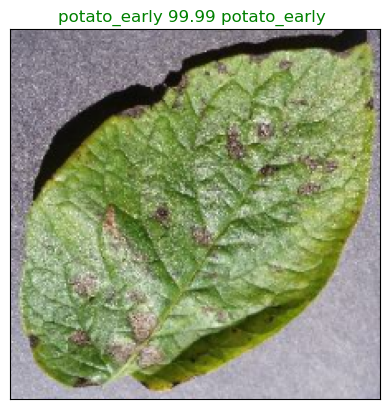

In [53]:
plot_prediction(predictions,labels=val_labels,images=val_images,n=77)

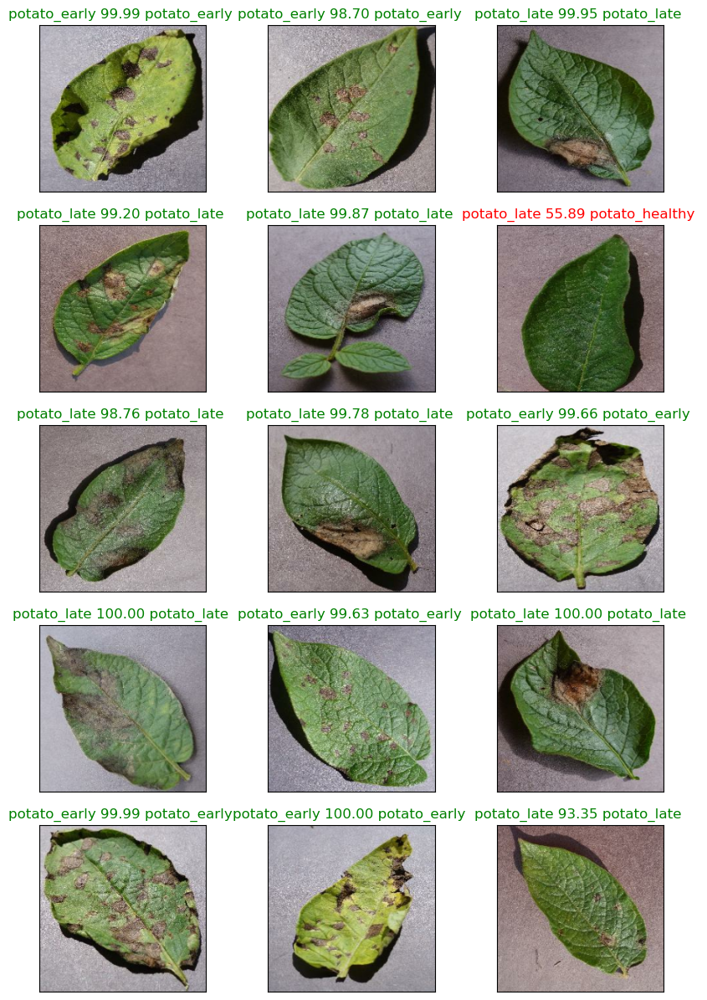

In [54]:
plt.figure(figsize=(10,15))
for i in range(0,15):
  plt.subplot(5,3,i+1)

  plot_prediction(predictions,labels=val_labels,images=val_images,n=i)

now we've got one function to visualize our models top prediction

this function will:
- take an input of prediction prob array and ground tuth and index
- Find the prediction using `get_pred_label()` ✅
- Find the top predicion:
  * prediction poba index ✅
  * prediction poba values ✅
  * prediction label ✅

- plot them

In [55]:
def plot_pred_conf(prediction_probabilities,labels,n=1):

  """
  Plus the top 10 hight predictions confidences along with
  the truth label for n smaple
  """

  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # get the prediction label fomr the function we created

  pred_label=get_prediction_label(pred_prob)


  # Find the predictions confidence indixes

  top_predictions_indexes=pred_prob.argsort()[::-1] # reverse them

  # find the top prediction confindacen value

  top_pred_values=pred_prob[top_predictions_indexes]


  # find the pred label

  top_pred_labels=unique_labels[top_predictions_indexes]

  # set up plot

  top_plots=plt.bar(np.arange(len(top_pred_values)), # x
                    top_pred_values, # y
                    color="grey"
                    )

  plt.xticks(np.arange(len(top_pred_values)),
             labels=top_pred_labels,
             rotation="vertical",
             )

  # chagne the color of true label to green and other to gray

  for i in range(len(top_predictions_indexes)):
    pred=top_pred_labels[i]

    # if equal to true label
    if pred==true_label:

      top_plots[i].set_color("green")

      break

In [56]:
predictions[0].argsort()[::-1] ## this will give the sort predictions indexs

array([0, 2, 1])

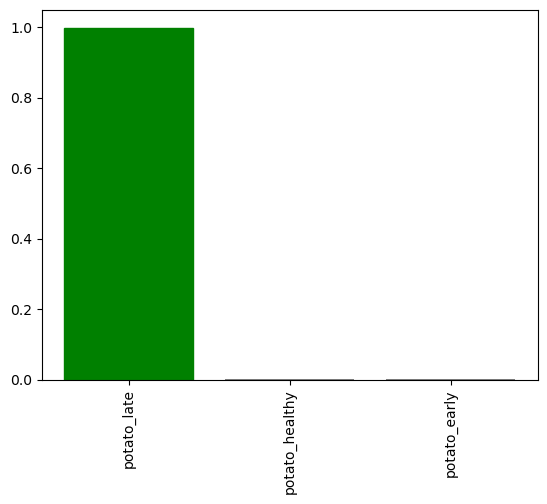

In [57]:
plot_pred_conf(predictions,val_labels,4)

Now we have got some function to visualize the prediction confidances

now lets add some more function to it and make it beautiful

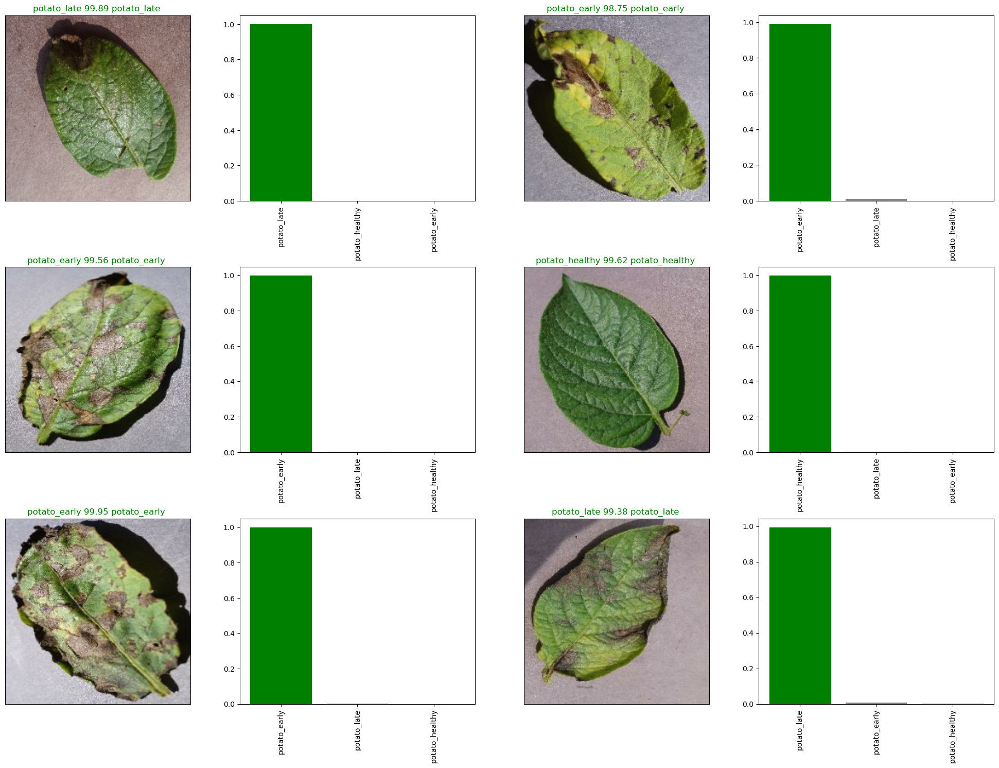

In [58]:
# Let's check out a few predictions and their different values

# Set the parameters for visualization
i_multiplier = 66
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

# Create a figure with appropriate dimensions
plt.figure(figsize=(10 * num_cols, 5 * num_rows))

# Iterate through the images and plot predictions and confidence
for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_prediction(predictions, labels=val_labels, images=val_images, n=i + i_multiplier)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i + i_multiplier)

# Adjust layout for better spacing
plt.tight_layout(h_pad=1.0)

# Show the plot
plt.show()


## Saving and reloading a trained model

In [162]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/Volumes/Project-2/programming/machine_deep_learning/DL/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [163]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

now we have function to load and save the model

In [77]:
# Save our model trained on 1000 images
save_model(model, suffix="001-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Deeplearning/leaf_disease/20230925-15451695656735-001-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Deeplearning/leaf_disease/20230925-15451695656735-001-images-mobilenetv2-Adam.h5'

In [ ]:
# load the model

model=load_model("./models/model1.h5")


In [ ]:
model.summary()

## sample testing

In [ ]:
test_img=''

## Train on full Dataset

In [44]:
import pandas as pd
import numpy as np

In [30]:
import os

class_names=[]

df_data={}

# get all the  folder names

for folder in os.listdir("./data/PlantVillage/"):
    if(folder.startswith(".") or folder.startswith("logs")):
        continue
    class_names.append(folder)

# get all the file paths


for class_name in class_names:
    # get all the file names
    file_names=os.listdir("./data/PlantVillage/"+class_name)
    df_data[class_name]=file_names

    


In [54]:
df_data[class_names[0]]

['0022d6b7-d47c-4ee2-ae9a-392a53f48647___JR_B.Spot 8964.JPG',
 '006adb74-934f-448f-a14f-62181742127b___JR_B.Spot 3395.JPG',
 '00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG',
 '01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Spot 3262.JPG',
 '0169b9ac-07b9-4be1-8b85-da94481f05a4___NREC_B.Spot 9169.JPG',
 '018e494e-d2eb-468b-9d02-40219d9f4921___JR_B.Spot 9045.JPG',
 '01940b6d-7dea-4889-a7b8-a35f4e9bba34___NREC_B.Spot 9120.JPG',
 '01dfb88b-cd5a-420c-b163-51f5fe07b74d___JR_B.Spot 9091.JPG',
 '01ebc916-4793-40a3-b5e4-a32687e4fa3d___NREC_B.Spot 9125.JPG',
 '024623ab-be81-4d99-a653-c3be1495ce8e___JR_B.Spot 8889.JPG',
 '02baf62e-11e2-4dde-97fb-e369b57d55d3___JR_B.Spot 8971.JPG',
 '032aa7c4-0a95-4f09-b0bb-1242f4f32d82___NREC_B.Spot 1889.JPG',
 '03bb7042-3fd5-42e1-aa2c-d51d6843704c___JR_B.Spot 8925.JPG',
 '0448a226-3d3a-494d-a026-a92b048689c7___JR_B.Spot 8897.JPG',
 '0495b4d4-66a4-438c-862d-c483f08e4a95___JR_B.Spot 3288.JPG',
 '04d46cfb-9cc8-4083-82af-ca2bb57c8182___NREC_B.Spot 1814.JPG'

In [ ]:
# make dataset for full data set
df = pd.DataFrame(columns=['id', 'leaf_family','file_path'])


for key in df_data:
    print(f"{key}>> ",len(df_data[key]))
    for i in range(len(df_data[key])):
        id=df_data[key][i][:-4]
        leaf_family=key
        file_path="./data/PlantVillage/"+key+'/'+df_data[key][i]

        df = df.append({'id': id, 'leaf_family': leaf_family, 'file_path': file_path}, ignore_index=True)

df.to_csv("./data/PlantVillage/PlantVillage.csv",index=False)

    #     # df = df.append({'id': df_data[key][i][:-4], 'leaf_family': key, 'file_path': "./data/PlantVillage/"+key+'/'+df_data[key][i]}, ignore_index=True)
    #     print(df_data[key][i][:-4],key,"./data/PlantVillage/"+key+'/'+df_data[key][i])




In [39]:
# save the data frame

df.to_csv("./data/PlantVillage.csv",index=False)

In [57]:
# now Turn all label
labels=df['leaf_family'].to_numpy()

# find the unique labels
unique_labels=np.unique(labels)
boolean_labels=[label==unique_labels for label in labels]

In [58]:
boolean_labels[0]

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [53]:
file_paths=df["file_path"]
X=file_paths
y=boolean_labels

In [11]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

Found GPU at: /device:GPU:0
